In [1]:
!wget --header 'Host: doc-0c-1k-docs.googleusercontent.com' --user-agent 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:83.0) Gecko/20100101 Firefox/83.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' --header 'Accept-Language: en-US,en;q=0.5' --header 'Cookie: AUTH_csdjgvpst22uelm6baj76hav932efism_nonce=cf7ociqn3q2hk' --header 'Upgrade-Insecure-Requests: 1' 'https://doc-0c-1k-docs.googleusercontent.com/docs/securesc/jagppijtrb6btv4lqfjr0bmqujr0tjj4/4j0h2cqs1fcao0b75cq50kom45gppj66/1606720050000/15262444124766430801/15262444124766430801/1PYTWabfiDIvS8SQvAKBySUvCcU7wcqEK?e=download&authuser=1&nonce=cf7ociqn3q2hk&user=15262444124766430801&hash=v82qg6is3f08kbjbfvnn925fg5nujfbg' --output-document 'data_augmentation_1.zip'

--2020-11-30 07:08:32--  https://doc-0c-1k-docs.googleusercontent.com/docs/securesc/jagppijtrb6btv4lqfjr0bmqujr0tjj4/4j0h2cqs1fcao0b75cq50kom45gppj66/1606720050000/15262444124766430801/15262444124766430801/1PYTWabfiDIvS8SQvAKBySUvCcU7wcqEK?e=download&authuser=1&nonce=cf7ociqn3q2hk&user=15262444124766430801&hash=v82qg6is3f08kbjbfvnn925fg5nujfbg
Resolving doc-0c-1k-docs.googleusercontent.com (doc-0c-1k-docs.googleusercontent.com)... 108.177.126.132, 2a00:1450:4013:c01::84
Connecting to doc-0c-1k-docs.googleusercontent.com (doc-0c-1k-docs.googleusercontent.com)|108.177.126.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-zip-compressed]
Saving to: ‘data_augmentation_1.zip’

data_augmentation_1     [          <=>       ] 171.97M  48.5MB/s    in 3.5s    

2020-11-30 07:08:37 (48.5 MB/s) - ‘data_augmentation_1.zip’ saved [180323258]



In [2]:
!unzip data_augmentation_1

Streaming output truncated to the last 5000 lines.
  inflating: data_augmentation_1/data_1/train/not_damaged/0569.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0569_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0570.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0570_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0571.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0571_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0572.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0572_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0573.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0573_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0574.jpg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0574_aug_0.jpeg  
  inflating: data_augmentation_1/data_1/train/not_damaged/0575.jpg  
  inflatin

### Importing Libraries

In [3]:
#Importing required libraries
import os
import json
import urllib
import numpy as np 
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline
import random as rn
import pickle
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
import datetime
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import optimizers
from tensorflow.keras import applications
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, History
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D,Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping

In [4]:
#Creating a folder to save models
os.mkdir('densenet')

In [5]:
#Creating a funciton which sets layers to non trainable if required
def non_trainable(model):
    for i in range(len(model.layers)):
      model.layers[i].trainable = False
    return model

In [6]:
#Plotting metrics for neural networks models
def plot_metrics(nn_model,metric):
  plt.figure(figsize = (10,5))
  plt.plot(nn_model.history.history[metric])
  plt.plot(nn_model.history.history['val_'+metric])
  plt.title('model '+metric)
  plt.ylabel(metric)
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()
  idx = np.argmax(nn_model.history.history['val_accuracy'])
  print('The '+metric+' for final model is ',nn_model.history.history['val_'+metric][idx])

In [7]:
#Plotting confusion matrix
def binary_confusion_matrix(true_y,pred_y,labels_list):
  Cm = confusion_matrix(true_y,pred_y)
  print("-"*50, "Confusion matrix", "-"*50)
  cmap=sns.light_palette("blue")
  plt.figure(figsize=(10,5))
  sns.heatmap(Cm, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels_list, yticklabels=labels_list)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()

In [8]:
def multiclass_confusion_matrix(true_y,pred_y,labels_list):
  Cm = confusion_matrix(true_y,pred_y)
  Pm = (Cm/Cm.sum(axis = 0))
  Rm = (((Cm.T)/(Cm.sum(axis =1))).T)
  cmap = sns.light_palette('blue')
  mt = [Cm,Pm,Rm]
  names = ['Confusion Matrix','Precision Matrix','Recall Matrix']
  print('Average Precision is',np.trace(Pm)/3)
  print('Average Recall is',np.trace(Rm)/3)
  for i in range(len(mt)):
    print('-'*50,names[i],'-'*50)
    plt.figure(figsize = (10,5))
    sns.heatmap(mt[i],annot = True,cmap = cmap,fmt = ".3f",xticklabels = labels_list,yticklabels = labels_list)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

In [9]:
def compute_precision_recall(true_y,true_pred):
  tp,fn,fp,tn = confusion_matrix(true_y,true_pred).ravel()
  precision = tp/(tp+fp)
  recall = tp/(tp+fn)
  return precision,recall

In [10]:
densenet_scores = pd.DataFrame(columns = ['Model','Accuracy','Precision','Recall'])

# Orginal Data

In [11]:
#Data for Neural Networks
input_shapes = (256,256,3)
batch_size = 8

In [12]:
#Classes
stage1_class_labels = ['damaged','not_damaged']
stage2_class_labels = ['front','rear','side']
stage3_class_labels = ['minor','moderate','severe']

## Densenet

### Baseline Model

In [13]:
def model_features(model,train_dir,test_dir):
    train_gen = ImageDataGenerator()
    test_gen = ImageDataGenerator()
    
    train_fd = train_gen.flow_from_directory(train_dir,target_size = (256,256),batch_size = 1,shuffle = False)
    test_fd = test_gen.flow_from_directory(test_dir,target_size = (256,256),batch_size = 1,shuffle = False)
    
    train_features = model.predict(train_fd)
    test_features = model.predict(test_fd)
    
    return train_features,test_features,train_fd,test_fd

In [21]:
def target_feat(fd_class):
    temp_dict = dict(fd_class.class_indices)
    keys = list(temp_dict.keys())
    values = list(temp_dict.values())
    
    y = [keys[values.index(i)] for i in fd_class.classes]
    
    return y

In [ ]:
#Importing Densenet model and setting layers as non trainable
densenet = applications.DenseNet201(include_top=False,weights = 'imagenet',input_shape=(256,256,3))
densenet = non_trainable(densenet)
fc = Flatten()(densenet.output)
model_densenet = Model(inputs = densenet.input,outputs = fc)

74842112/74836368 [==============================] - 1s 0us/step


### Stage 1

In [ ]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

In [ ]:
train_feat,test_feat,train_fd,test_fd = model_features(model_densenet,train_data_dir, test_data_dir)

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.


In [ ]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

In [ ]:
train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [ ]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

  0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
 14%|█▍        | 1/7 [00:55<05:35, 55.93s/it]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:


Accuracy for alpha 0.0001 is  0.8926630434782609
Accuracy for alpha 0.001 is  0.8817934782608695
Accuracy for alpha 0.01 is  0.8885869565217391
Accuracy for alpha 0.1 is  0.8845108695652174
Accuracy for alpha 1 is  0.8804347826086957
Accuracy for alpha 10 is  0.8777173913043478
Accuracy for alpha 100 is  0.8804347826086957


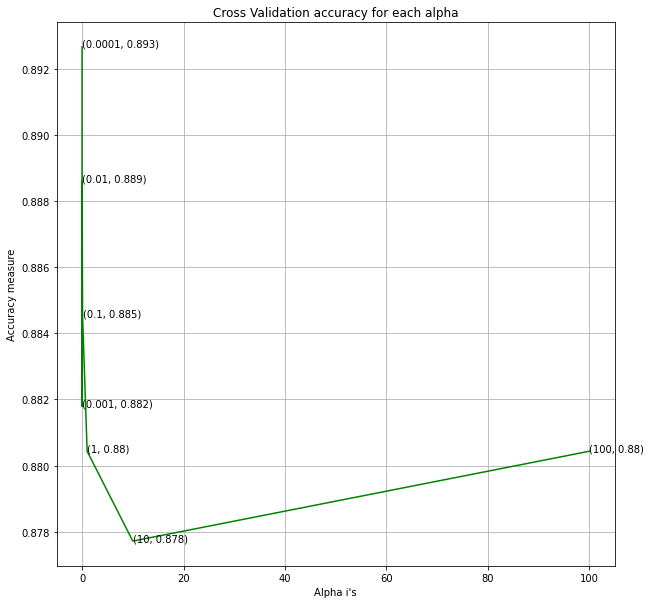

In [ ]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy on test data for final baseline model 0.8804347826086957
Precision on test data for final baseline model 0.8755364806866953
Recall on test data for final baseline model 0.8869565217391304
-------------------------------------------------- Confusion matrix --------------------------------------------------


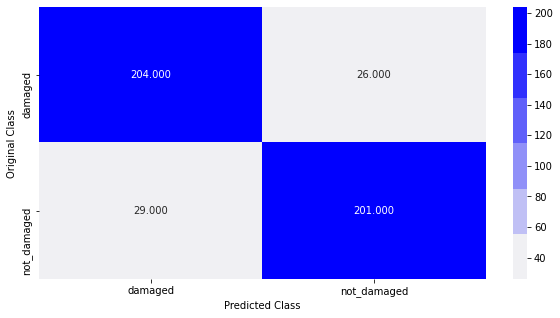

In [ ]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model
save_path = 'densenet/densenet_stage1_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print ('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
precision,recall = compute_precision_recall(y_test,predict_y)
print ('Precision on test data for final baseline model',precision)
print ('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_test,predict_y,stage1_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage1_baseline','Accuracy':'0.880','Precision':'0.875','Recall':'0.887'},ignore_index= True)

### Stage 2

In [ ]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

In [ ]:
train_feat,test_feat,train_fd,test_fd = model_features(model_densenet,train_data_dir, test_data_dir)

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.


In [ ]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

In [ ]:
train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [ ]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

  0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
 14%|█▍        | 1/7 [01:35<09:33, 95.66s/it]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:


Accuracy for alpha 0.0001 is  0.700507614213198
Accuracy for alpha 0.001 is  0.7081218274111675
Accuracy for alpha 0.01 is  0.700507614213198
Accuracy for alpha 0.1 is  0.6979695431472082
Accuracy for alpha 1 is  0.6878172588832487
Accuracy for alpha 10 is  0.6700507614213198
Accuracy for alpha 100 is  0.6725888324873096


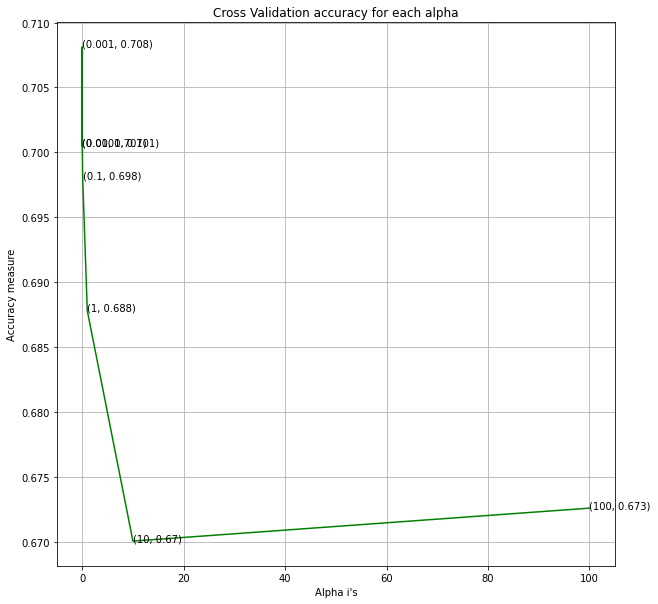

In [ ]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy on test data for final baseline model 0.5977653631284916
Average Precision is 0.5902172689406733
Average Recall is 0.5787441610245105
-------------------------------------------------- Confusion Matrix --------------------------------------------------


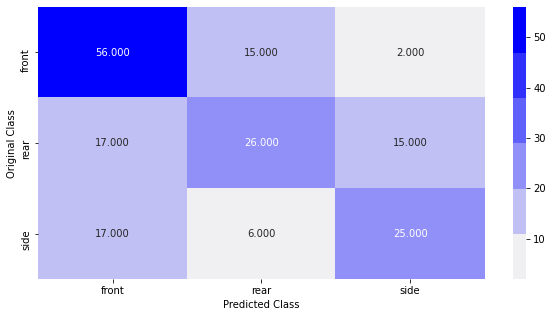

-------------------------------------------------- Precision Matrix --------------------------------------------------


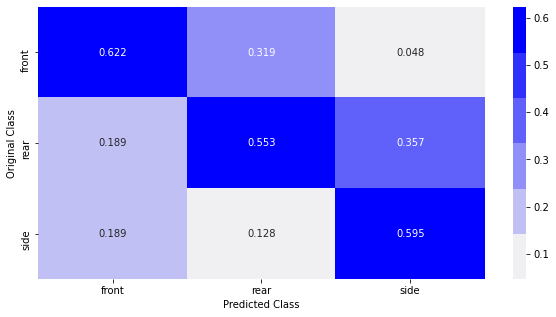

-------------------------------------------------- Recall Matrix --------------------------------------------------


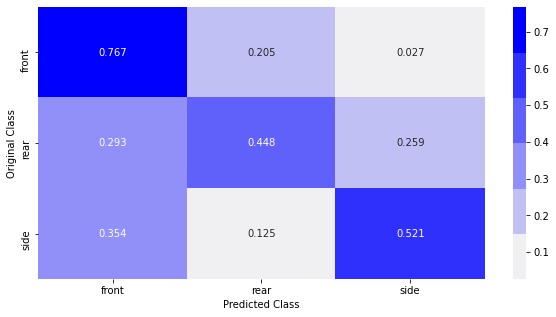

In [ ]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model 
save_path = 'densenet/densenet_stage2_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print ('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
multiclass_confusion_matrix(y_test,predict_y,stage2_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage2_baseline','Accuracy':'0.598','Precision':'0.590','Recall':'0.579'},ignore_index= True)

### Stage 3

In [ ]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

In [ ]:
train_feat,test_feat,train_fd,test_fd = model_features(model_densenet,train_data_dir, test_data_dir)

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.


In [ ]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

In [ ]:
train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [ ]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

  0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
 14%|█▍        | 1/7 [01:42<10:12, 102.10s/it]/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:

Accuracy for alpha 0.0001 is  0.6556122448979592
Accuracy for alpha 0.001 is  0.6632653061224489
Accuracy for alpha 0.01 is  0.6785714285714286
Accuracy for alpha 0.1 is  0.673469387755102
Accuracy for alpha 1 is  0.6811224489795918
Accuracy for alpha 10 is  0.6658163265306123
Accuracy for alpha 100 is  0.6581632653061225


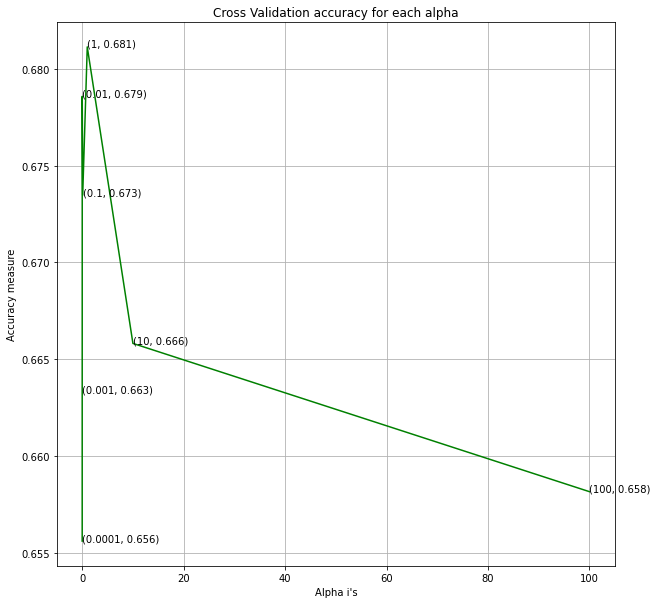

In [ ]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy on test data for final baseline model 0.5497076023391813
Average Precision is 0.5404725992961287
Average Recall is 0.5455065359477124
-------------------------------------------------- Confusion Matrix --------------------------------------------------


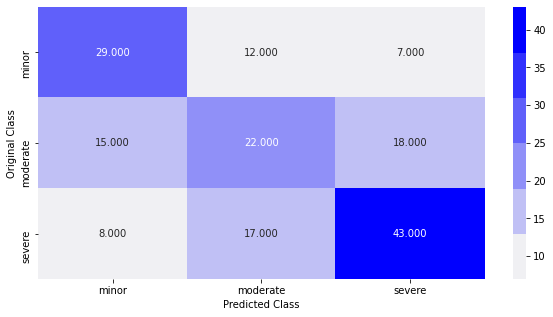

-------------------------------------------------- Precision Matrix --------------------------------------------------


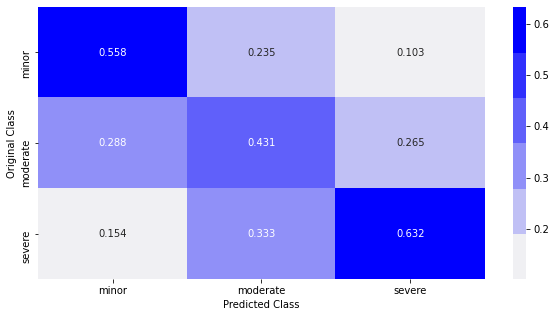

-------------------------------------------------- Recall Matrix --------------------------------------------------


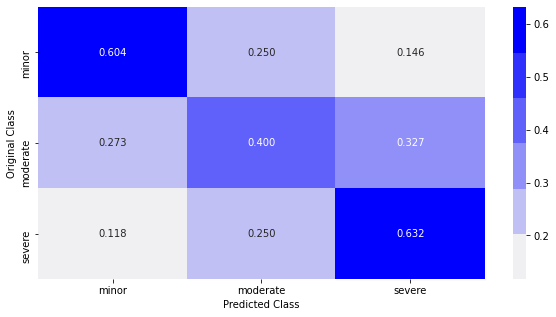

In [ ]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model
save_path = 'densenet/densenet_stage3_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print ('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
multiclass_confusion_matrix(y_test,predict_y,stage3_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage3_baseline','Accuracy':'0.550','Precision':'0.540','Recall':'0.545'},ignore_index= True)

### CNN (Training FC layers only)

In [ ]:
def create_model(n_classes,output_activation):
    os.environ['PYTHONHASHSEED'] = '0'
    tf.keras.backend.clear_session()

    ## Set the random seed values to regenerate the model.
    np.random.seed(0)
    rn.seed(0)

    #Input layer
    input_layer = Input(shape=(256,256,3),name='Input_Layer')

    #Adding pretrained model
    densenet = applications.DenseNet201(include_top=False,weights = 'imagenet',input_tensor = input_layer)
    densenet = non_trainable(densenet)

    #Flatten
    flatten = Flatten(data_format='channels_last',name='Flatten')(densenet.output)

    #FC layer
    FC1 = Dense(units=512,activation='relu',name='FC1')(flatten)

    #FC layer
    FC2 = Dense(units=256,activation='relu',name='FC2')(FC1)

    #Dropout layer
    droput1 = Dropout(0.5)(FC2)

    #output layer
    Out = Dense(units=n_classes,activation=output_activation,name='Output')(droput1)

    #Creating the Model
    model = Model(inputs=input_layer,outputs=Out)

    return model

### Stage 1

In [ ]:
model = create_model(1,'sigmoid')

In [ ]:
#Compiling the model
model.compile(loss = 'binary_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



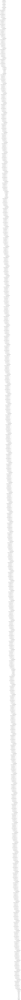

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [ ]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage1_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

In [ ]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [ ]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")

n_validation_steps = 460/batch_size
n_steps_epoch = 3680/batch_size

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.


In [ ]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
460/460 [==============================] - ETA: 0s - loss: 0.8021 - accuracy: 0.7481
Epoch 00001: val_accuracy improved from -inf to 0.81304, saving model to densenet/densenet_stage1_fc-0.813.hdf5
460/460 [==============================] - 40s 87ms/step - loss: 0.8021 - accuracy: 0.7481 - val_loss: 0.4443 - val_accuracy: 0.8130
Epoch 2/50
460/460 [==============================] - ETA: 0s - loss: 0.4233 - accuracy: 0.8329
Epoch 00002: val_accuracy improved from 0.81304 to 0.83261, saving model to densenet/densenet_stage1_fc-0.833.hdf5
460/460 [==============================] - 37s 79ms/step - loss: 0.4233 - accuracy: 0.8329 - val_loss: 0.4090 - val_accuracy: 0.8326
Epoch 3/50
460/460 [==============================] - ETA: 0s - loss: 0.3417 - accuracy: 0.8543
Epoch 00003: val_accuracy improved from 0.83261 to 0.84783, saving model to densenet/densenet_stage1_fc-0.848.hdf5
460/460 [==============================] - 37s 81ms/step - loss: 0.3417 - accuracy: 0.8543 - val_loss: 0

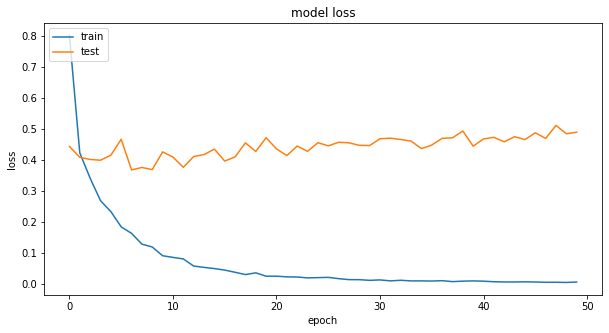

The loss for final model is  0.4485411047935486


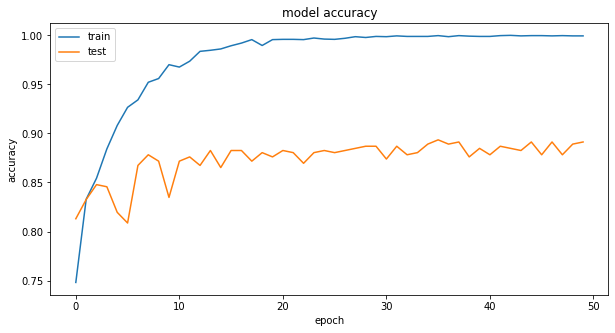

The accuracy for final model is  0.893478274345398


In [ ]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [ ]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1, class_mode = "binary",shuffle = False)

Found 460 images belonging to 2 classes.


In [ ]:
best_model = load_model('densenet/densenet_stage1_fc-0.893.hdf5')

In [ ]:
y_pred = best_model.predict(x_test)

In [ ]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  if i <= .5:
    y_predicted.append('damaged')
  elif i > .5:
    y_predicted.append('not_damaged')

Precision on test data for final baseline model 0.8884120171673819
Recall on test data for final baseline model 0.9
-------------------------------------------------- Confusion matrix --------------------------------------------------


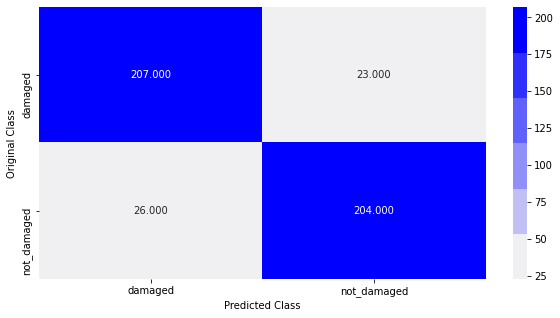

In [ ]:
precision,recall = compute_precision_recall(y_true,y_predicted)
print ('Precision on test data for final baseline model',precision)
print ('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_true,y_predicted,stage1_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage1 FC','Accuracy':'0.893','Precision':'0.888','Recall':'0.900'},ignore_index= True)

### Stage 2

In [ ]:
model = create_model(3,'softmax')

In [ ]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



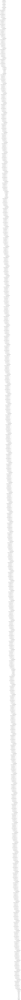

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [ ]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage2_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [ ]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [ ]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 179/batch_size
n_steps_epoch = 1970/batch_size

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.


In [ ]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
247/246 [==============================] - ETA: 0s - loss: 2.2128 - accuracy: 0.4152
Epoch 00001: val_accuracy improved from -inf to 0.49721, saving model to densenet/densenet_stage2_fc-0.497.hdf5
247/246 [==============================] - 23s 95ms/step - loss: 2.2128 - accuracy: 0.4152 - val_loss: 1.2473 - val_accuracy: 0.4972
Epoch 2/50
247/246 [==============================] - ETA: 0s - loss: 1.1773 - accuracy: 0.5223
Epoch 00002: val_accuracy did not improve from 0.49721
247/246 [==============================] - 17s 68ms/step - loss: 1.1773 - accuracy: 0.5223 - val_loss: 1.2849 - val_accuracy: 0.4749
Epoch 3/50
247/246 [==============================] - ETA: 0s - loss: 0.9075 - accuracy: 0.6015
Epoch 00003: val_accuracy improved from 0.49721 to 0.54749, saving model to densenet/densenet_stage2_fc-0.547.hdf5
247/246 [==============================] - 20s 79ms/step - loss: 0.9075 - accuracy: 0.6015 - val_loss: 1.1310 - val_accuracy: 0.5475
Epoch 4/50
247/246 [===========

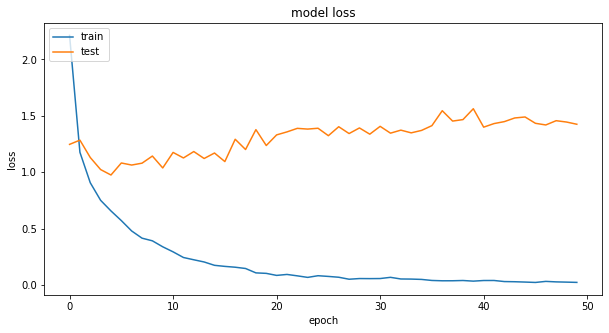

The loss for final model is  1.3312376737594604


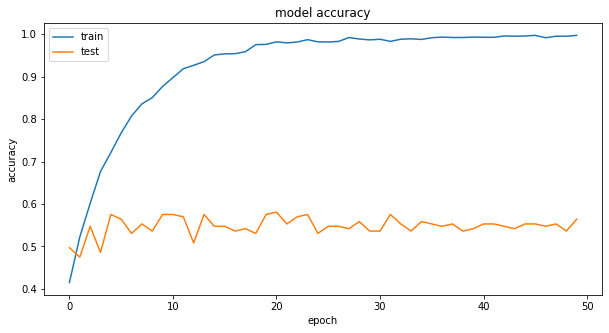

The accuracy for final model is  0.5810055732727051


In [ ]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [ ]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 179 images belonging to 3 classes.


In [ ]:
best_model = load_model('densenet/densenet_stage2_fc-0.581.hdf5')

In [ ]:
y_pred = best_model.predict(x_test)

In [ ]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('front')
  elif n== 1:
    y_predicted.append('rear')
  elif n == 2:
    y_predicted.append('side')

Average Precision is 0.5829408686551544
Average Recall is 0.5638482128798614
-------------------------------------------------- Confusion Matrix --------------------------------------------------


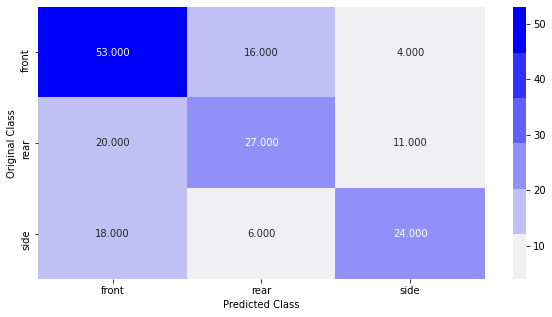

-------------------------------------------------- Precision Matrix --------------------------------------------------


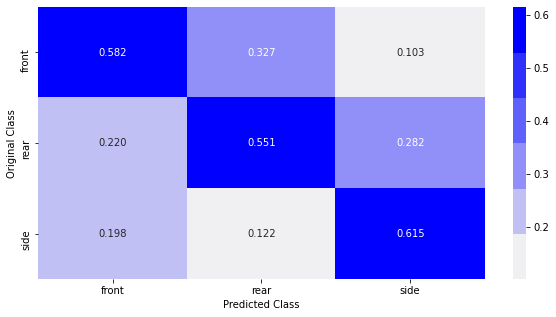

-------------------------------------------------- Recall Matrix --------------------------------------------------


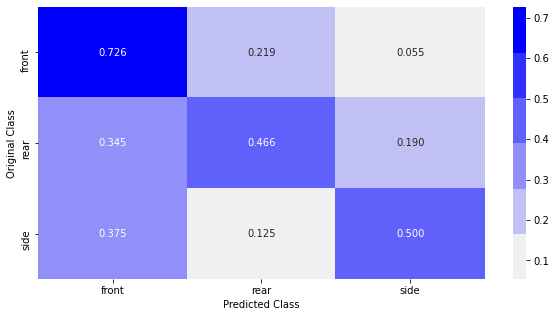

In [ ]:
multiclass_confusion_matrix(y_true,y_predicted,stage2_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage2 FC','Accuracy':'0.581','Precision':'0.583','Recall':'0.564'},ignore_index= True)

### Stage 3

In [ ]:
model = create_model(3,'softmax')

In [ ]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



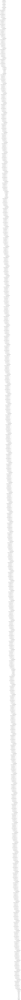

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [ ]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage3_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [14]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [ ]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 171/batch_size
n_steps_epoch = 1958/batch_size

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.


In [ ]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
245/244 [==============================] - ETA: 0s - loss: 2.1243 - accuracy: 0.4377
Epoch 00001: val_accuracy improved from -inf to 0.54971, saving model to densenet/densenet_stage3_fc-0.550.hdf5
245/244 [==============================] - 23s 93ms/step - loss: 2.1243 - accuracy: 0.4377 - val_loss: 1.1472 - val_accuracy: 0.5497
Epoch 2/50
245/244 [==============================] - ETA: 0s - loss: 1.0405 - accuracy: 0.5587
Epoch 00002: val_accuracy did not improve from 0.54971
245/244 [==============================] - 17s 69ms/step - loss: 1.0405 - accuracy: 0.5587 - val_loss: 1.1340 - val_accuracy: 0.4854
Epoch 3/50
245/244 [==============================] - ETA: 0s - loss: 0.8251 - accuracy: 0.6384
Epoch 00003: val_accuracy did not improve from 0.54971
245/244 [==============================] - 17s 68ms/step - loss: 0.8251 - accuracy: 0.6384 - val_loss: 1.1252 - val_accuracy: 0.4912
Epoch 4/50
245/244 [==============================] - ETA: 0s - loss: 0.6999 - accuracy: 0.

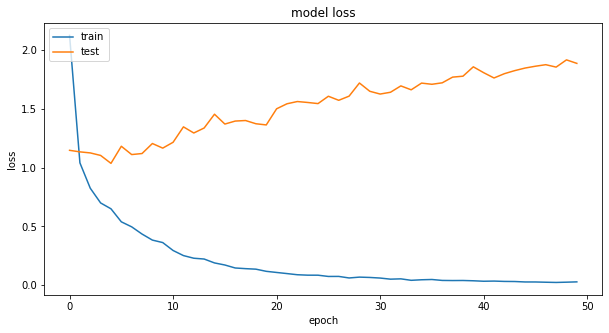

The loss for final model is  1.1658482551574707


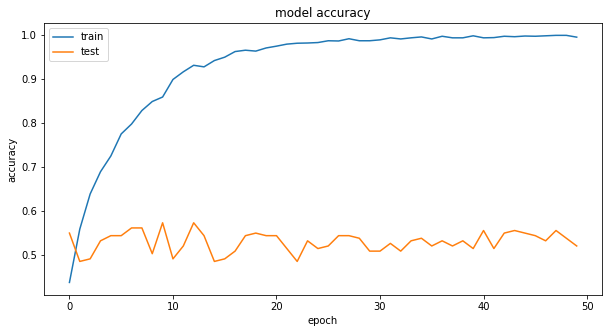

The accuracy for final model is  0.5730994343757629


In [ ]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [16]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 171 images belonging to 3 classes.


In [18]:
best_model = load_model('densenet/densenet_stage3_fc-0.573.hdf5')

In [19]:
y_pred = best_model.predict(x_test)

In [22]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('minor')
  elif n== 1:
    y_predicted.append('moderate')
  elif n == 2:
    y_predicted.append('severe')

Average Precision is 0.5777034559643256
Average Recall is 0.5691399286987523
-------------------------------------------------- Confusion Matrix --------------------------------------------------


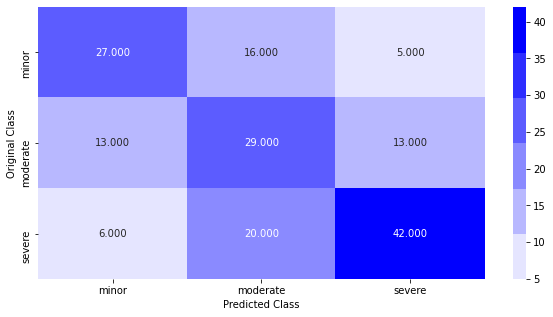

-------------------------------------------------- Precision Matrix --------------------------------------------------


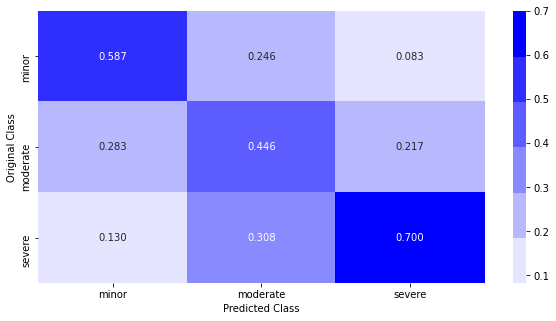

-------------------------------------------------- Recall Matrix --------------------------------------------------


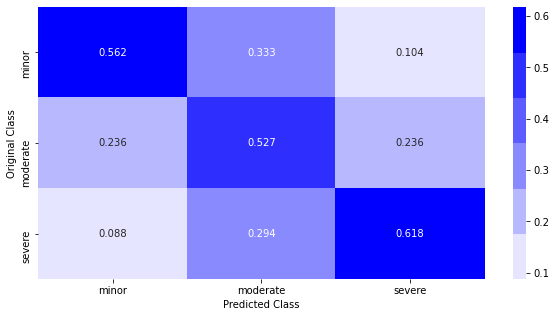

In [23]:
multiclass_confusion_matrix(y_true,y_predicted,stage3_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage3 FC','Accuracy':'0.573','Precision':'0.578','Recall':'0.569'},ignore_index= True)

### CNN (Training All layers only)

In [15]:
def create_model(n_classes,output_activation):
    os.environ['PYTHONHASHSEED'] = '0'
    tf.keras.backend.clear_session()

    ## Set the random seed values to regenerate the model.
    np.random.seed(0)
    rn.seed(0)

    #Input layer
    input_layer = Input(shape=(256,256,3),name='Input_Layer')

    #Adding pretrained model
    densenet = applications.DenseNet201(include_top=False,weights = 'imagenet',input_tensor = input_layer)

    #Flatten
    flatten = Flatten(data_format='channels_last',name='Flatten')(densenet.output)

    #FC layer
    FC1 = Dense(units=512,activation='relu',name='FC1')(flatten)

    #FC layer
    FC2 = Dense(units=256,activation='relu',name='FC2')(FC1)

    #Dropout layer
    droput1 = Dropout(0.5)(FC2)

    #output layer
    Out = Dense(units=n_classes,activation=output_activation,name='Output')(droput1)

    #Creating the Model
    model = Model(inputs=input_layer,outputs=Out)

    return model

### Stage 1

In [ ]:
model = create_model(1,'sigmoid')

In [ ]:
#Compiling the model
model.compile(loss = 'binary_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



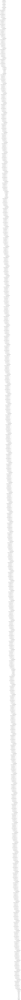

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [ ]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage1_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

In [ ]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [ ]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")

n_validation_steps = 460/batch_size
n_steps_epoch = 3680/batch_size

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.


In [ ]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
460/460 [==============================] - ETA: 0s - loss: 0.4533 - accuracy: 0.7897
Epoch 00001: val_accuracy improved from -inf to 0.91957, saving model to densenet/densenet_stage1_all-0.920.hdf5
460/460 [==============================] - 101s 218ms/step - loss: 0.4533 - accuracy: 0.7897 - val_loss: 0.2133 - val_accuracy: 0.9196
Epoch 2/50
460/460 [==============================] - ETA: 0s - loss: 0.2676 - accuracy: 0.8946
Epoch 00002: val_accuracy improved from 0.91957 to 0.92391, saving model to densenet/densenet_stage1_all-0.924.hdf5
460/460 [==============================] - 98s 213ms/step - loss: 0.2676 - accuracy: 0.8946 - val_loss: 0.1793 - val_accuracy: 0.9239
Epoch 3/50
460/460 [==============================] - ETA: 0s - loss: 0.2189 - accuracy: 0.9147
Epoch 00003: val_accuracy improved from 0.92391 to 0.92826, saving model to densenet/densenet_stage1_all-0.928.hdf5
460/460 [==============================] - 98s 212ms/step - loss: 0.2189 - accuracy: 0.9147 - val_

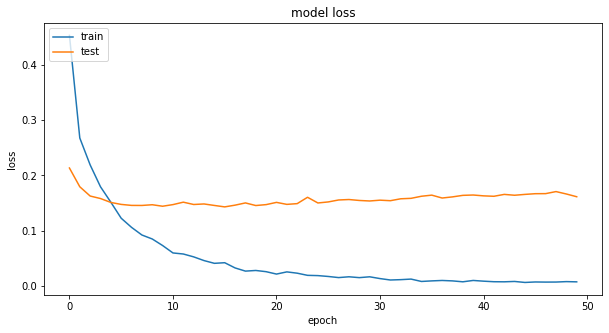

The loss for final model is  0.15895713865756989


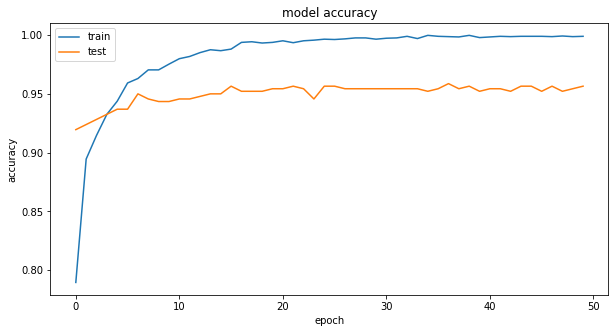

The accuracy for final model is  0.958695650100708


In [ ]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [ ]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1, class_mode = "binary",shuffle = False)

Found 460 images belonging to 2 classes.


In [ ]:
best_model = load_model('densenet/densenet_stage1_all-0.959.hdf5')

In [ ]:
y_pred = best_model.predict(x_test)

In [ ]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  if i <= .5:
    y_predicted.append('damaged')
  elif i > .5:
    y_predicted.append('not_damaged')

Precision on test data for final baseline model 0.948936170212766
Recall on test data for final baseline model 0.9695652173913043
-------------------------------------------------- Confusion matrix --------------------------------------------------


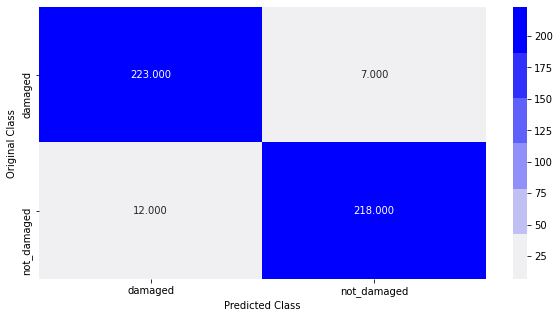

In [ ]:
precision,recall = compute_precision_recall(y_true,y_predicted)
print ('Precision on test data for final baseline model',precision)
print ('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_true,y_predicted,stage1_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage1 all','Accuracy':'0.959','Precision':'0.949','Recall':'0.970'},ignore_index= True)

### Stage 2

In [33]:
model = create_model(3,'softmax')

In [34]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [35]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



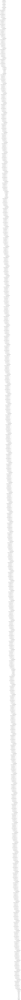

In [36]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [37]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage2_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [38]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [39]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 179/batch_size
n_steps_epoch = 1970/batch_size

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.


In [40]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
247/246 [==============================] - ETA: 0s - loss: 1.2320 - accuracy: 0.4508
Epoch 00001: val_accuracy improved from -inf to 0.56983, saving model to densenet/densenet_stage2_all-0.570.hdf5
247/246 [==============================] - 41s 166ms/step - loss: 1.2320 - accuracy: 0.4508 - val_loss: 0.9375 - val_accuracy: 0.5698
Epoch 2/50
247/246 [==============================] - ETA: 0s - loss: 0.8285 - accuracy: 0.6330
Epoch 00002: val_accuracy improved from 0.56983 to 0.57542, saving model to densenet/densenet_stage2_all-0.575.hdf5
247/246 [==============================] - 38s 155ms/step - loss: 0.8285 - accuracy: 0.6330 - val_loss: 0.8703 - val_accuracy: 0.5754
Epoch 3/50
247/246 [==============================] - ETA: 0s - loss: 0.6268 - accuracy: 0.7426
Epoch 00003: val_accuracy improved from 0.57542 to 0.70391, saving model to densenet/densenet_stage2_all-0.704.hdf5
247/246 [==============================] - 39s 156ms/step - loss: 0.6268 - accuracy: 0.7426 - val_l

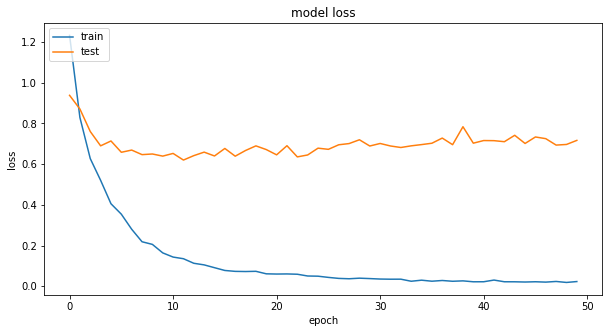

The loss for final model is  0.7149006724357605


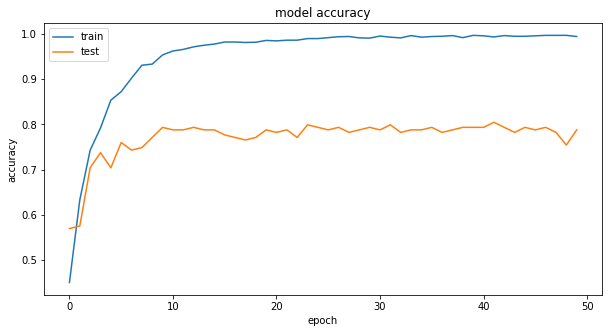

The accuracy for final model is  0.8044692873954773


In [41]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [42]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 179 images belonging to 3 classes.


In [43]:
best_model = load_model('densenet/densenet_stage2_all-0.804.hdf5')

In [44]:
y_pred = best_model.predict(x_test)

In [45]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('front')
  elif n== 1:
    y_predicted.append('rear')
  elif n == 2:
    y_predicted.append('side')

Average Precision is 0.8073567411460708
Average Recall is 0.7891736209520811
-------------------------------------------------- Confusion Matrix --------------------------------------------------


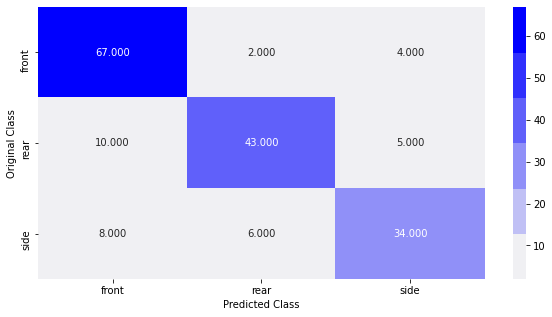

-------------------------------------------------- Precision Matrix --------------------------------------------------


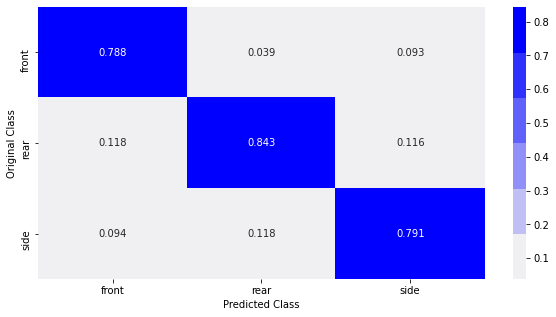

-------------------------------------------------- Recall Matrix --------------------------------------------------


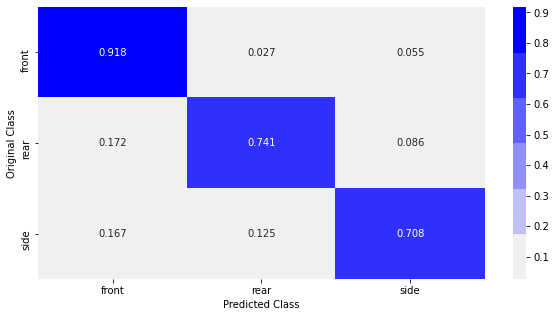

In [46]:
multiclass_confusion_matrix(y_true,y_predicted,stage2_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage2 all','Accuracy':'0.804','Precision':'0.807','Recall':'0.789'},ignore_index= True)

### Stage 3

In [ ]:
model = create_model(3,'softmax')

74842112/74836368 [==============================] - 1s 0us/step


In [ ]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Layer (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           Input_Layer[0][0]                
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473074 to fit



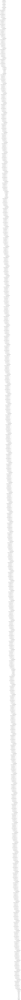

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [ ]:
#Model saving based on validation accuracy score
filepath="densenet/densenet_stage3_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [ ]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [ ]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 171/batch_size
n_steps_epoch = 1958/batch_size

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.


In [ ]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=50,callbacks=[checkpoint])

Epoch 1/50
245/244 [==============================] - ETA: 0s - loss: 1.2011 - accuracy: 0.4351
Epoch 00001: val_accuracy improved from -inf to 0.58480, saving model to densenet/densenet_stage3_all-0.585.hdf5
245/244 [==============================] - 60s 244ms/step - loss: 1.2011 - accuracy: 0.4351 - val_loss: 0.9327 - val_accuracy: 0.5848
Epoch 2/50
245/244 [==============================] - ETA: 0s - loss: 0.8253 - accuracy: 0.6277
Epoch 00002: val_accuracy did not improve from 0.58480
245/244 [==============================] - 50s 204ms/step - loss: 0.8253 - accuracy: 0.6277 - val_loss: 0.8770 - val_accuracy: 0.5848
Epoch 3/50
245/244 [==============================] - ETA: 0s - loss: 0.6737 - accuracy: 0.7053
Epoch 00003: val_accuracy improved from 0.58480 to 0.63743, saving model to densenet/densenet_stage3_all-0.637.hdf5
245/244 [==============================] - 53s 217ms/step - loss: 0.6737 - accuracy: 0.7053 - val_loss: 0.7912 - val_accuracy: 0.6374
Epoch 4/50
245/244 [======

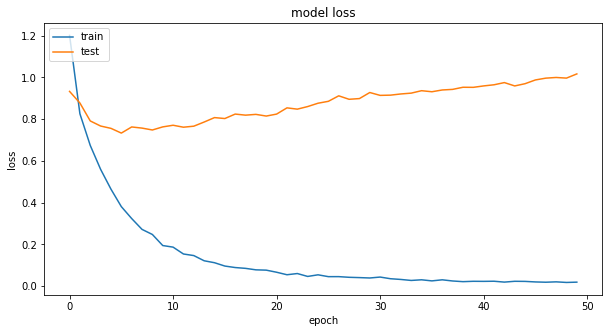

The loss for final model is  0.7705633044242859


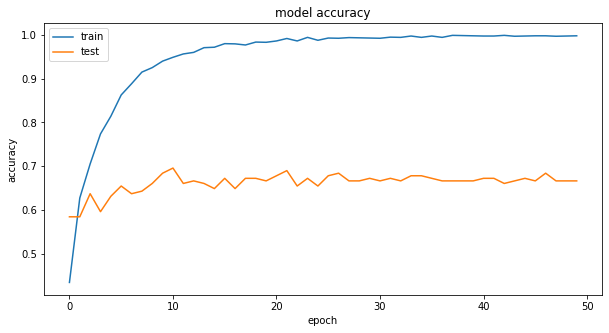

The accuracy for final model is  0.6959064602851868


In [ ]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [24]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 171 images belonging to 3 classes.


In [27]:
best_model = load_model('densenet/densenet_stage3_all-0.696.hdf5')

In [28]:
y_pred = best_model.predict(x_test)

In [29]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('minor')
  elif n== 1:
    y_predicted.append('moderate')
  elif n == 2:
    y_predicted.append('severe')

Average Precision is 0.6916722924474863
Average Recall is 0.6846108140225787
-------------------------------------------------- Confusion Matrix --------------------------------------------------


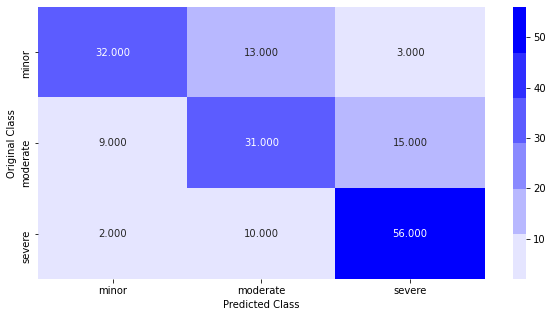

-------------------------------------------------- Precision Matrix --------------------------------------------------


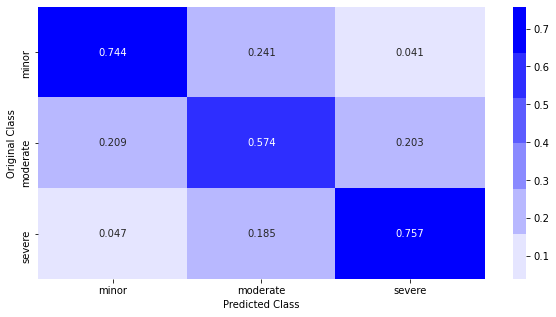

-------------------------------------------------- Recall Matrix --------------------------------------------------


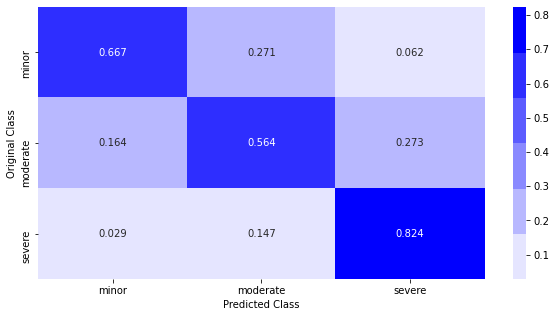

In [30]:
multiclass_confusion_matrix(y_true,y_predicted,stage3_class_labels)

In [ ]:
densenet_scores = densenet_scores.append({'Model':'Densenet_stage3 all','Accuracy':'0.696','Precision':'0.692','Recall':'0.685'},ignore_index= True)

In [ ]:
densenet_scores.to_csv('densenet_scores.csv',index=False)